In [2]:
# devtools::unload("rlang")

In [2]:
# In case the gargle pacjage can not be installed with bigquery from CRAN, you have to install it from GitHub by  the following commands. 
# install.packages("pak")
# pak::pak("r-lib/gargle")

In [1]:
install.packages('DT')
install.packages("bigrquery")

also installing the dependencies ‘lazyeval’, ‘crosstalk’


Updating HTML index of packages in '.Library'

Making 'packages.html' ...
 done

also installing the dependency ‘rapidjsonr’


Updating HTML index of packages in '.Library'

Making 'packages.html' ...
 done



In [2]:
# Restart the Kernel

In [3]:
library(tidyverse)
library(DBI)
library(stringr)
library(DT)
library(lubridate)

── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.3     ✔ readr     2.1.4
✔ forcats   1.0.0     ✔ stringr   1.5.0
✔ ggplot2   3.4.4     ✔ tibble    3.2.1
✔ lubridate 1.9.3     ✔ tidyr     1.3.0
✔ purrr     1.0.2     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors


In [4]:
con <- dbConnect(
  bigrquery::bigquery(),
  project = "cal-itp-data-infra" ,
  dataset = "mart_gtfs" #,
#  billing = "billing"
  )

In [14]:
NS_None = read_csv("data/NS None Route.csv")

Rows: 3833 Columns: 3
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
dbl  (1): Bus
date (1): Date
time (1): Time

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


In [15]:
NS_NoneD = NS_None %>% 
    distinct()
head(NS_NoneD)

Date,Time,Bus
<date>,<time>,<dbl>
2024-11-01,14:27:00,3902
2024-11-01,14:39:00,3902
2024-11-01,14:40:00,3902
2024-11-01,14:45:00,3902
2024-11-01,14:56:00,3902
2024-11-01,06:07:00,3915


In [9]:
dim(NS_NoneD)

[1] 2118    3

In [20]:
querySolTrans2 = "
SELECT 
  gtfs_dataset_name,
  datetime(_extract_ts, 'America/Los_Angeles') extract_ts_pasific, 
  header_timestamp,
  vehicle_timestamp,
  vehicle_label,
  trip_id,
  trip_route_id,
from `cal-itp-data-infra.mart_gtfs.fct_vehicle_positions_messages` vpm
where gtfs_dataset_name like 'SolTrans%'
and dt between '2024-11-01' and '2024-12-01'
and date(datetime(_extract_ts, 'America/Los_Angeles')) between '2024-11-01' and '2024-11-30'
"
SolTrans2 = dbGetQuery(con, querySolTrans2)
SolTrans2 %>% 
    saveRDS("data/SolTrans2.rds")


In [10]:
SolTrans2 = readRDS("data/SolTrans2.rds")

In [11]:
temp = SolTrans2

In [20]:
SolTrans2 = temp
SolTrans2 = SolTrans2 %>%
    mutate(`On Trip` = !is.na(trip_id)) 
head(SolTrans2)
dim(SolTrans2)

gtfs_dataset_name,extract_ts_pasific,header_timestamp,vehicle_timestamp,vehicle_label,trip_id,trip_route_id,On Trip
<chr>,<dttm>,<dttm>,<dttm>,<chr>,<chr>,<chr>,<lgl>
SolTrans Vehicle Positions,2024-11-01 03:11:40,2024-11-01 10:11:30,2024-11-01 10:10:19,5109,NA,NA,FALSE
SolTrans Vehicle Positions,2024-11-01 03:12:00,2024-11-01 10:12:00,2024-11-01 10:10:19,5109,NA,NA,FALSE
SolTrans Vehicle Positions,2024-11-01 03:12:20,2024-11-01 10:12:00,2024-11-01 10:10:19,5109,NA,NA,FALSE
SolTrans Vehicle Positions,2024-11-01 03:12:40,2024-11-01 10:12:30,2024-11-01 10:10:19,5109,NA,NA,FALSE
SolTrans Vehicle Positions,2024-11-01 03:13:00,2024-11-01 10:13:00,2024-11-01 10:10:19,5109,NA,NA,FALSE
SolTrans Vehicle Positions,2024-11-01 03:13:20,2024-11-01 10:13:00,2024-11-01 10:10:19,5109,NA,NA,FALSE


[1] 1365927       8

In [24]:
summary(SolTrans2)

 gtfs_dataset_name  extract_ts_pasific            header_timestamp             
 Length:1365927     Min.   :2024-11-01 03:11:40   Min.   :2024-11-01 10:11:30  
 Class :character   1st Qu.:2024-11-07 18:17:00   1st Qu.:2024-11-08 02:17:00  
 Mode  :character   Median :2024-11-15 09:30:40   Median :2024-11-15 17:30:30  
                    Mean   :2024-11-15 12:16:49   Mean   :2024-11-15 20:12:38  
                    3rd Qu.:2024-11-22 06:58:40   3rd Qu.:2024-11-22 14:58:30  
                    Max.   :2024-11-30 22:04:40   Max.   :2024-12-01 06:04:30  
 vehicle_timestamp             vehicle_label        trip_id         
 Min.   :2024-11-01 10:10:19   Length:1365927     Length:1365927    
 1st Qu.:2024-11-08 02:16:49   Class :character   Class :character  
 Median :2024-11-15 17:29:56   Mode  :character   Mode  :character  
 Mean   :2024-11-15 20:12:07                                        
 3rd Qu.:2024-11-22 14:58:01                                        
 Max.   :2024-12-01 06:04:

In [25]:
SolTrans2 %>% is.na() %>% colSums()

gtfs_dataset_name extract_ts_pasific   header_timestamp  vehicle_timestamp 
                 0                  0                  0                  0 
     vehicle_label            trip_id      trip_route_id            On Trip 
                 0             184805            1365744                  0

In [26]:
SolTrans2 %>% 
    filter(!`On Trip`) %>% 
    distinct(vehicle_label)

vehicle_label
<chr>
5109
3910
4503
5101
3901
3902
3904
3905
3906


In [27]:
SolTrans2 %>% 
    distinct(vehicle_label) %>% 
    arrange(vehicle_label)

vehicle_label
<chr>
3901
3902
3904
3905
3906
3908
3910
3911
3912


In [33]:
SolTrans2 %>% 
    filter(as.Date(extract_ts_pasific) == '2024-11-01',
           !`On Trip`) %>% 
    group_by(vehicle_label) %>% 
    summarise(n = n())


vehicle_label,n
<chr>,<int>
3902,190
3904,509
3905,265
3906,242
3910,232
3911,277
3912,3
3914,306
3915,579


In [61]:
SolTrans2 = SolTrans2 %>% 
    mutate(Date = as.Date(extract_ts_pasific), 
           Time =  format(extract_ts_pasific, format = "%H:%M:%S"),
           Bus = vehicle_label)

In [62]:
SolTrans2 %>% 
    filter(Date == '2024-11-01',
           Time == '14:27:00',
           vehicle_label == '3902'
           ) 

gtfs_dataset_name,extract_ts_pasific,header_timestamp,vehicle_timestamp,vehicle_label,trip_id,trip_route_id,Date,Time,Bus
<chr>,<dttm>,<dttm>,<dttm>,<chr>,<chr>,<chr>,<date>,<chr>,<chr>
SolTrans Vehicle Positions,2024-11-01 14:27:00,2024-11-01 21:27:00,2024-11-01 21:26:56,3902,355,NA,2024-11-01,14:27:00,3902


In [73]:
NS_NoneD1 = NS_NoneD %>% 
    mutate(Time = format(Time, format = "%H:%M:%S"),
           Bus = as.character(Bus))
head(NS_NoneD1)

Date,Time,Bus
<date>,<chr>,<chr>
2024-11-01,14:27:00,3902
2024-11-01,14:39:00,3902
2024-11-01,14:40:00,3902
2024-11-01,14:45:00,3902
2024-11-01,14:56:00,3902
2024-11-01,06:07:00,3915


In [78]:
dim(NS_NoneD1)

[1] 2118    3

In [74]:
NS_NoneD1 %>% 
    inner_join(SolTrans2)

Joining, by = c("Date", "Time", "Bus")


Date,Time,Bus,gtfs_dataset_name,extract_ts_pasific,header_timestamp,vehicle_timestamp,vehicle_label,trip_id,trip_route_id
<date>,<chr>,<chr>,<chr>,<dttm>,<dttm>,<dttm>,<chr>,<chr>,<chr>
2024-11-01,14:27:00,3902,SolTrans Vehicle Positions,2024-11-01 14:27:00,2024-11-01 21:27:00,2024-11-01 21:26:56,3902,355,NA
2024-11-01,14:39:00,3902,SolTrans Vehicle Positions,2024-11-01 14:39:00,2024-11-01 21:39:00,2024-11-01 21:38:56,3902,356,NA
2024-11-01,14:40:00,3902,SolTrans Vehicle Positions,2024-11-01 14:40:00,2024-11-01 21:40:00,2024-11-01 21:39:59,3902,356,NA
2024-11-01,14:45:00,3902,SolTrans Vehicle Positions,2024-11-01 14:45:00,2024-11-01 21:45:00,2024-11-01 21:44:55,3902,356,NA
2024-11-01,14:56:00,3902,SolTrans Vehicle Positions,2024-11-01 14:56:00,2024-11-01 21:56:00,2024-11-01 21:55:55,3902,356,NA
2024-11-01,06:07:00,3915,SolTrans Vehicle Positions,2024-11-01 06:07:00,2024-11-01 13:07:00,2024-11-01 13:06:52,3915,NA,NA
2024-11-01,06:39:00,3915,SolTrans Vehicle Positions,2024-11-01 06:39:00,2024-11-01 13:39:00,2024-11-01 13:36:52,3915,NA,NA
2024-11-01,07:00:00,3915,SolTrans Vehicle Positions,2024-11-01 07:00:00,2024-11-01 14:00:00,2024-11-01 13:59:56,3915,29,NA
2024-11-01,07:14:00,3915,SolTrans Vehicle Positions,2024-11-01 07:14:00,2024-11-01 14:14:00,2024-11-01 14:13:57,3915,30,NA


In [115]:
NS_NoneD1 %>% 
    inner_join(SolTrans2) %>% 
    datatable(class = 'cell-border stripe', 
              options = list(pageLength = 20, dom = 'tp'),
              caption = ''
             )


Joining, by = c("Date", "Time", "Bus")


HTML widgets cannot be represented in plain text (need html)

In [81]:
NS_NoneD1 %>% 
    anti_join(SolTrans2)

Joining, by = c("Date", "Time", "Bus")


Date,Time,Bus
<date>,<chr>,<chr>
2024-11-01,07:30:00,3916
2024-11-01,12:06:00,5111
2024-11-01,12:19:00,5111
2024-11-01,06:13:00,5116
2024-11-01,06:15:00,5116
2024-11-01,10:20:00,5118
2024-11-01,10:21:00,5118
2024-11-02,11:30:00,3912
2024-11-02,10:29:00,3913


In [82]:
NS_NoneD1 %>% 
    mutate(T1 = format(Time, format = "%H:%M"))


Date,Time,Bus,T1
<date>,<chr>,<chr>,<chr>
2024-11-01,14:27:00,3902,14:27:00
2024-11-01,14:39:00,3902,14:39:00
2024-11-01,14:40:00,3902,14:40:00
2024-11-01,14:45:00,3902,14:45:00
2024-11-01,14:56:00,3902,14:56:00
2024-11-01,06:07:00,3915,06:07:00
2024-11-01,06:39:00,3915,06:39:00
2024-11-01,07:00:00,3915,07:00:00
2024-11-01,07:14:00,3915,07:14:00


In [94]:
SolTrans2 %>% 
    mutate(Time =  paste(hour(extract_ts_pasific), minute(extract_ts_pasific), "00", sep = ":")) %>% 
    right_join(NS_NoneD1) %>% 
    select(-extract_ts_pasific, -header_timestamp, -vehicle_timestamp) %>% 
    distinct()

Joining, by = c("Date", "Time", "Bus")


gtfs_dataset_name,vehicle_label,trip_id,trip_route_id,Date,Time,Bus
<chr>,<chr>,<chr>,<chr>,<date>,<chr>,<chr>
SolTrans Vehicle Positions,3901,1424,NA,2024-11-23,10:23:00,3901
SolTrans Vehicle Positions,3901,1424,NA,2024-11-23,10:32:00,3901
SolTrans Vehicle Positions,3901,909,NA,2024-11-23,10:32:00,3901
SolTrans Vehicle Positions,3901,909,NA,2024-11-23,10:50:00,3901
SolTrans Vehicle Positions,3901,909,NA,2024-11-23,10:51:00,3901
SolTrans Vehicle Positions,3901,911,NA,2024-11-23,11:45:00,3901
SolTrans Vehicle Positions,3901,912,NA,2024-11-23,13:40:00,3901
SolTrans Vehicle Positions,3901,912,NA,2024-11-23,13:52:00,3901
SolTrans Vehicle Positions,3901,914,NA,2024-11-23,14:43:00,3901


In [103]:
# SolTrans2 %>% 
#     mutate(h = format(header_timestamp, tz="America/Los_Angeles"))
SolTrans3 = SolTrans2 %>% 
    mutate(Time =  paste(hour(format(header_timestamp, tz="America/Los_Angeles")), minute(format(header_timestamp, tz="America/Los_Angeles")), "00", sep = ":")) %>% 
    select(-extract_ts_pasific, -header_timestamp, -vehicle_timestamp) 

In [106]:
SolTrans2 %>% 
    mutate(Time =  paste(hour(format(vehicle_timestamp, tz="America/Los_Angeles")), minute(format(vehicle_timestamp, tz="America/Los_Angeles")), "00", sep = ":")) %>% 
    right_join(NS_NoneD1) %>% 
    select(-extract_ts_pasific, -header_timestamp, -vehicle_timestamp) %>% 
    distinct()

Joining, by = c("Date", "Time", "Bus")


gtfs_dataset_name,vehicle_label,trip_id,trip_route_id,Date,Time,Bus
<chr>,<chr>,<chr>,<chr>,<date>,<chr>,<chr>
SolTrans Vehicle Positions,3901,1424,NA,2024-11-23,10:23:00,3901
SolTrans Vehicle Positions,3901,909,NA,2024-11-23,10:32:00,3901
SolTrans Vehicle Positions,3901,909,NA,2024-11-23,10:50:00,3901
SolTrans Vehicle Positions,3901,909,NA,2024-11-23,10:51:00,3901
SolTrans Vehicle Positions,3901,911,NA,2024-11-23,11:45:00,3901
SolTrans Vehicle Positions,3901,912,NA,2024-11-23,13:40:00,3901
SolTrans Vehicle Positions,3901,912,NA,2024-11-23,13:52:00,3901
SolTrans Vehicle Positions,3901,914,NA,2024-11-23,14:43:00,3901
SolTrans Vehicle Positions,3901,914,NA,2024-11-23,15:22:00,3901


In [111]:
SolTrans4 = SolTrans3 %>% 
    select(-Time) %>% 
    distinct()

In [113]:
NS_NoneD1 %>% 
    left_join(SolTrans4)

Joining, by = c("Date", "Bus")


Date,Time,Bus,gtfs_dataset_name,vehicle_label,trip_id,trip_route_id
<date>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
2024-11-01,14:27:00,3902,SolTrans Vehicle Positions,3902,NA,NA
2024-11-01,14:27:00,3902,SolTrans Vehicle Positions,3902,352,NA
2024-11-01,14:27:00,3902,SolTrans Vehicle Positions,3902,353,NA
2024-11-01,14:27:00,3902,SolTrans Vehicle Positions,3902,354,NA
2024-11-01,14:27:00,3902,SolTrans Vehicle Positions,3902,356,NA
2024-11-01,14:27:00,3902,SolTrans Vehicle Positions,3902,358,NA
2024-11-01,14:27:00,3902,SolTrans Vehicle Positions,3902,359,NA
2024-11-01,14:27:00,3902,SolTrans Vehicle Positions,3902,360,NA
2024-11-01,14:27:00,3902,SolTrans Vehicle Positions,3902,361,NA


In [13]:
SolTrans2 %>% 
    head()

gtfs_dataset_name,extract_ts_pasific,header_timestamp,vehicle_timestamp,vehicle_label,trip_id,trip_route_id
<chr>,<dttm>,<dttm>,<dttm>,<chr>,<chr>,<chr>
SolTrans Vehicle Positions,2024-11-01 03:11:40,2024-11-01 10:11:30,2024-11-01 10:10:19,5109,NA,NA
SolTrans Vehicle Positions,2024-11-01 03:12:00,2024-11-01 10:12:00,2024-11-01 10:10:19,5109,NA,NA
SolTrans Vehicle Positions,2024-11-01 03:12:20,2024-11-01 10:12:00,2024-11-01 10:10:19,5109,NA,NA
SolTrans Vehicle Positions,2024-11-01 03:12:40,2024-11-01 10:12:30,2024-11-01 10:10:19,5109,NA,NA
SolTrans Vehicle Positions,2024-11-01 03:13:00,2024-11-01 10:13:00,2024-11-01 10:10:19,5109,NA,NA
SolTrans Vehicle Positions,2024-11-01 03:13:20,2024-11-01 10:13:00,2024-11-01 10:10:19,5109,NA,NA


In [23]:
SolTrans2 %>% 
    filter(date(extract_ts_pasific) == "2024-11-01",
           vehicle_label == "3915") %>% 
    arrange(extract_ts_pasific) %>% 
    datatable(class = 'cell-border stripe', 
              options = list(pageLength = 20, dom = 'tp'),
              caption = ''
             )


HTML widgets cannot be represented in plain text (need html)

In [10]:
# querySolTrans5 = "
# SELECT 
#   gtfs_dataset_name,
#   datetime(_extract_ts, 'America/Los_Angeles') extract_ts_pasific, 
#   vehicle_label,
#   trip_id,
#   trip_route_id,
#   position_latitude,
#   position_longitude,
#   schedule_gtfs_dataset_key,
#   service_date  

# from `cal-itp-data-infra.mart_gtfs.fct_vehicle_positions_messages` vpm
# where gtfs_dataset_name like 'SolTrans%'
# and dt between '2024-11-01' and '2024-12-01'
# and date(datetime(_extract_ts, 'America/Los_Angeles')) between '2024-11-01' and '2024-11-30'
# "
# SolTrans5 = dbGetQuery(con, querySolTrans5)
# SolTrans5 %>% 
#     saveRDS("data/SolTrans5.rds")


In [5]:
SolTrans5 = readRDS("data/SolTrans5.rds")

In [8]:
SolTrans5 %>%
    select(-schedule_gtfs_dataset_key, -service_date) %>% 
    filter(
        # date(extract_ts_pasific) == "2024-11-19",
        vehicle_label == "3401") %>% 
    arrange(extract_ts_pasific) %>% 
    datatable(class = 'cell-border stripe', 
              options = list(pageLength = 20, dom = 'tp'),
              caption = ''
             )


HTML widgets cannot be represented in plain text (need html)

In [9]:
SolTransTU = readRDS("data/SolTransTU.rds")

In [10]:
head(SolTransTU)

extract_ts_pasific,Bus,trip_id,schedule_gtfs_dataset_key,service_date
<dttm>,<chr>,<chr>,<chr>,<date>
2024-11-01 03:11:40,5109,87,755bc2b140995ecf1c477d9fa53a34d0,2024-11-01
2024-11-01 03:12:00,5109,87,755bc2b140995ecf1c477d9fa53a34d0,2024-11-01
2024-11-01 03:12:20,5109,87,755bc2b140995ecf1c477d9fa53a34d0,2024-11-01
2024-11-01 03:12:40,5109,87,755bc2b140995ecf1c477d9fa53a34d0,2024-11-01
2024-11-01 03:13:00,5109,87,755bc2b140995ecf1c477d9fa53a34d0,2024-11-01
2024-11-01 03:13:20,5109,87,755bc2b140995ecf1c477d9fa53a34d0,2024-11-01


In [13]:
SolTransTU %>%
    select(-schedule_gtfs_dataset_key, -service_date) %>% 
    filter(
        # date(extract_ts_pasific) == "2024-11-19",
        Bus == "3904") %>% 
    arrange(extract_ts_pasific) %>% 
    datatable(class = 'cell-border stripe', 
              options = list(pageLength = 20, dom = 'tp'),
              caption = ''
             )


Warning message in instance$preRenderHook(instance):
“It seems your data is too big for client-side DataTables. You may consider server-side processing: https://rstudio.github.io/DT/server.html”


HTML widgets cannot be represented in plain text (need html)

In [12]:
SolTrans6 = SolTrans5 %>% 
    filter(date(extract_ts_pasific) == "2024-11-01",
           vehicle_label == "3915") %>% 
    arrange(extract_ts_pasific) 
head(SolTrans6)

gtfs_dataset_name,extract_ts_pasific,vehicle_label,trip_id,trip_route_id,position_latitude,position_longitude,schedule_gtfs_dataset_key,service_date
<chr>,<dttm>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<chr>,<date>
SolTrans Vehicle Positions,2024-11-01 05:29:40,3915,NA,NA,38.13435,-122.2512,755bc2b140995ecf1c477d9fa53a34d0,2024-11-01
SolTrans Vehicle Positions,2024-11-01 05:30:00,3915,NA,NA,38.13435,-122.2512,755bc2b140995ecf1c477d9fa53a34d0,2024-11-01
SolTrans Vehicle Positions,2024-11-01 05:30:20,3915,NA,NA,38.13435,-122.2512,755bc2b140995ecf1c477d9fa53a34d0,2024-11-01
SolTrans Vehicle Positions,2024-11-01 05:30:40,3915,NA,NA,38.13435,-122.2512,755bc2b140995ecf1c477d9fa53a34d0,2024-11-01
SolTrans Vehicle Positions,2024-11-01 05:31:00,3915,NA,NA,38.13434,-122.2512,755bc2b140995ecf1c477d9fa53a34d0,2024-11-01
SolTrans Vehicle Positions,2024-11-01 05:31:20,3915,NA,NA,38.13434,-122.2512,755bc2b140995ecf1c477d9fa53a34d0,2024-11-01


In [13]:
querySolTrans7 = "
SELECT 
  service_date,
  gtfs_dataset_key schedule_gtfs_dataset_key,
  trip_id,
  direction_id,
  route_id,
  route_long_name

from `cal-itp-data-infra.mart_gtfs.fct_scheduled_trips`
where name like 'SolTrans%'
and service_date between '2024-11-01' and '2024-12-01'
"
SolTrans7 = dbGetQuery(con, querySolTrans7)


In [43]:
SolTrans6 %>% 
    left_join(SolTrans7) %>% 
    select(-schedule_gtfs_dataset_key, -service_date) %>% 
    datatable(class = 'cell-border stripe', 
              options = list(pageLength = 20, dom = 'tp'),
              caption = ''
             )


Joining, by = c("trip_id", "schedule_gtfs_dataset_key", "service_date")


HTML widgets cannot be represented in plain text (need html)

In [19]:
SolTrans5 %>%
    filter(date(extract_ts_pasific) == "2024-11-01"
           ,
           vehicle_label == "5118"
    ) %>% 
    arrange(extract_ts_pasific) %>% 
    left_join(SolTrans7) %>% 
    select(-schedule_gtfs_dataset_key, -service_date) %>% 
    # filter(route_id == "5") %>% 
    datatable(class = 'cell-border stripe', 
              options = list(pageLength = 20, dom = 'tp'),
              caption = ''
             )


Joining with `by = join_by(trip_id, schedule_gtfs_dataset_key, service_date)`


HTML widgets cannot be represented in plain text (need html)

In [11]:
queryVehcilePosition1314 = "
SELECT 
  gtfs_dataset_name,
  datetime(_extract_ts, 'America/Los_Angeles') extract_ts_pasific, 
  vehicle_label,
  trip_id,
  trip_route_id,
  position_latitude,
  position_longitude,
  schedule_gtfs_dataset_key,
  service_date  

from `cal-itp-data-infra.mart_gtfs.fct_vehicle_positions_messages` vpm
where gtfs_dataset_name like 'SolTrans%'
and dt between '2025-01-13' and '2025-01-16'
and date(datetime(_extract_ts, 'America/Los_Angeles')) between '2025-01-13' and '2025-01-15'
"
VehcilePosition1314 = dbGetQuery(con, queryVehcilePosition1314)
# SolTrans5 %>% 
#     saveRDS("data/SolTrans5.rds")


In [12]:
queryScheduledTrip1314 = "
SELECT 
  service_date,
  gtfs_dataset_key schedule_gtfs_dataset_key,
  trip_id,
  direction_id,
  route_id,
  route_long_name,
  trip_first_departure_datetime_pacific first_departure,
  trip_last_arrival_datetime_pacific last_arrival


from `cal-itp-data-infra.mart_gtfs.fct_scheduled_trips`
where name like 'SolTrans%'
and service_date between '2025-01-13' and '2025-01-15'
"
ScheduledTrip1314 = dbGetQuery(con, queryScheduledTrip1314)


In [13]:
VehcilePosition1314 %>%
    filter(date(extract_ts_pasific) == "2025-01-13"
           ,
           vehicle_label == "5055"
    ) %>% 
    arrange(extract_ts_pasific) %>% 
    left_join(ScheduledTrip1314) %>% 
    select(-schedule_gtfs_dataset_key, 
           -service_date,
           -trip_route_id,
           -position_latitude,
           -position_longitude

          ) %>% 
    # filter(route_id == "5") %>% 
    datatable(class = 'cell-border stripe', 
              options = list(pageLength = 20, dom = 'tp'),
              caption = ''
             )


Joining with `by = join_by(trip_id, schedule_gtfs_dataset_key, service_date)`


HTML widgets cannot be represented in plain text (need html)

In [25]:
SolTrans2 %>% is.na() %>% colSums()

gtfs_dataset_name extract_ts_pasific   header_timestamp  vehicle_timestamp 
                 0                  0                  0                  0 
     vehicle_label            trip_id      trip_route_id            On Trip 
                 0             184805            1365744                  0

In [135]:
santaClaritaDistinct = dbGetQuery(con,
"
with cte1 as(    
    SELECT *, first_value(_extract_ts) over(
      partition by 
        gtfs_dataset_key,
        dt,
        -- hour,
        base64_url,
        -- _extract_ts,
        -- _config_extract_ts,
        gtfs_dataset_name,
        schedule_gtfs_dataset_key,
        schedule_base64_url,
        schedule_name,
        schedule_feed_key,
        schedule_feed_timezone,
        -- COALESCE(
        --     trip_start_date,
        --     DATE(header_timestamp, schedule_feed_timezone),
        --     DATE(_extract_ts, schedule_feed_timezone)) AS service_date,

        -- TIMESTAMP_DIFF(_extract_ts, header_timestamp, SECOND) AS _header_message_age,
        -- TIMESTAMP_DIFF(_extract_ts, vehicle_timestamp, SECOND) AS _vehicle_message_age,
        -- TIMESTAMP_DIFF(header_timestamp, vehicle_timestamp, SECOND) AS _vehicle_message_age_vs_header,


        header_timestamp,
        header_version,
        header_incrementality,

        id,

        current_stop_sequence,
        stop_id,
        current_status,
        vehicle_timestamp,
        congestion_level,
        occupancy_status,
        occupancy_percentage,

        vehicle_id,
        vehicle_label,
        vehicle_license_plate,
        vehicle_wheelchair_accessible,

        trip_id,
        trip_route_id,
        trip_direction_id,
        trip_start_time,
        trip_start_time_interval,
        trip_start_date,
        trip_schedule_relationship,

        cast(position_latitude as string),
        cast(position_longitude as string),
        cast(position_bearing as string),
        cast(position_odometer as string),
        cast(position_speed as string)
      order by _extract_ts
    ) as new_extract_ts
    FROM`cal-itp-data-infra.mart_gtfs.fct_vehicle_positions_messages`
    where dt between '2024-10-22' and '2024-10-23'
and date(datetime(_extract_ts, 'America/Los_Angeles')) = '2024-10-22'
and gtfs_dataset_name = 'Santa Clarita VehiclePositions'
and vehicle_label = '282'
), 
cte2 as(
select distinct 
        gtfs_dataset_key,
        dt,
        -- hour,
        base64_url,
        new_extract_ts,
        -- _config_extract_ts,
        gtfs_dataset_name,
        schedule_gtfs_dataset_key,
        schedule_base64_url,
        schedule_name,
        schedule_feed_key,
        schedule_feed_timezone,
        COALESCE(
            trip_start_date,
            DATE(header_timestamp, schedule_feed_timezone),
            DATE(new_extract_ts, schedule_feed_timezone)) AS service_date,

        TIMESTAMP_DIFF(new_extract_ts, header_timestamp, SECOND) AS _header_message_age,
        TIMESTAMP_DIFF(new_extract_ts, vehicle_timestamp, SECOND) AS _vehicle_message_age,
        TIMESTAMP_DIFF(header_timestamp, vehicle_timestamp, SECOND) AS _vehicle_message_age_vs_header,


        header_timestamp,
        header_version,
        header_incrementality,

        id,

        current_stop_sequence,
        stop_id,
        current_status,
        vehicle_timestamp,
        congestion_level,
        occupancy_status,
        occupancy_percentage,

        vehicle_id,
        vehicle_label,
        vehicle_license_plate,
        vehicle_wheelchair_accessible,

        trip_id,
        trip_route_id,
        trip_direction_id,
        trip_start_time,
        trip_start_time_interval,
        trip_start_date,
        trip_schedule_relationship,

        position_latitude,
        position_longitude,
        position_bearing,
        position_odometer,
        position_speed
from cte1
)
select
  gtfs_dataset_name Agency,
  datetime(new_extract_ts, 'America/Los_Angeles') extract_ts_pasific, 
  _header_message_age HLatency,
  _vehicle_message_age VPLatency,
  vehicle_label,
  vehicle_id,
  position_latitude,
  position_longitude,
  trip_id
from cte2
"
                                 )

In [137]:
santaClaritaDistinct %>% 
    # filter(Agency == "Santa Clarita VehiclePositions",
    #        Vendor == "Connexionz Inc.",
    #        vehicle_label == "282") %>%
    arrange(desc(extract_ts_pasific)) %>% 
    mutate(`On Trip` = !is.na(trip_id),
           location = position_latitude + position_longitude, 
           location1 = lead(location, default = last(location)),
           Stationary = location == location1) %>% 
    datatable(class = 'cell-border stripe', 
              options = list(pageLength = 98, dom = 'tp'),
              caption = 'Vehicle Position Feed Latency Statistics by Vendors', rownames = TRUE
             )



HTML widgets cannot be represented in plain text (need html)

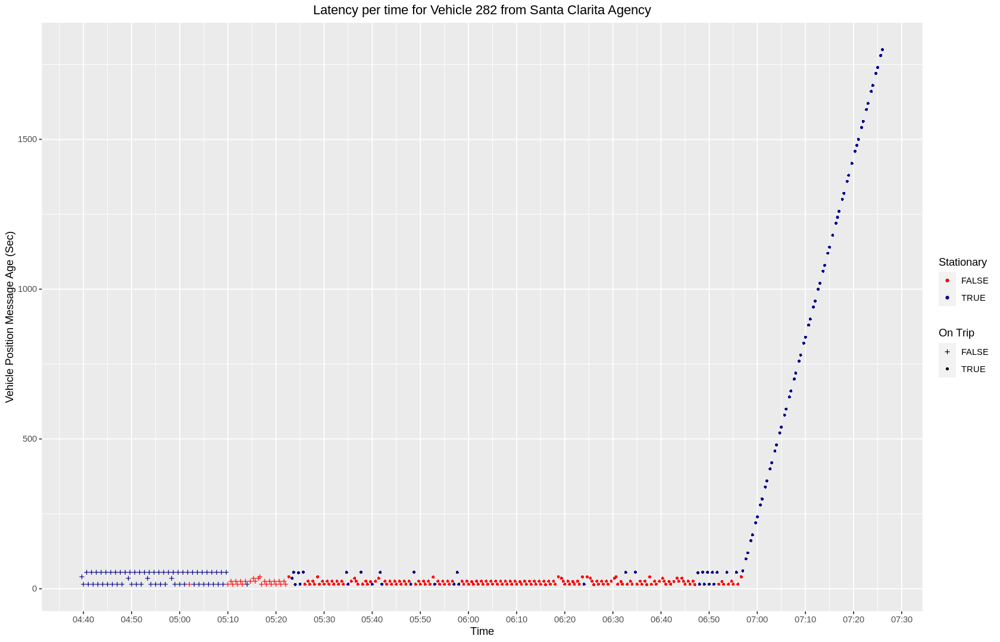

In [147]:
santaClaritaDistinct %>% 
    # filter(Agency == "Santa Clarita VehiclePositions",
    #        Vendor == "Connexionz Inc.",
    #        vehicle_label == "282") %>%
    arrange(desc(extract_ts_pasific)) %>% 
    mutate(`On Trip` = !is.na(trip_id),
           location = position_latitude + position_longitude, 
           location1 = lead(location, default = last(location)),
           Stationary = location == location1) %>% 
    ggplot(aes(extract_ts_pasific, VPLatency)) +
    geom_point(size = 1.1, aes(color = Stationary, shape = `On Trip`)) +
    xlab("Time") +
    ylab("Vehicle Position Message Age (Sec)") +
    ggtitle("Latency per time for Vehicle 282 from Santa Clarita Agency") +
    theme(plot.title = element_text(hjust = 0.5)) +
    scale_color_manual(values = c("red", "darkblue")) +
    scale_shape_manual(values = c(3, 16)) +
    scale_x_datetime( breaks = date_breaks("10 min"), 
                    labels = date_format("%H:%M", 
                                         # tz="CET"
                                        ), 
                    # expand = c(0,0)
                    )



In [141]:
santaClaritaDistinct$VPLatency %>% 
    summary()

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
   14.0    15.0    25.0   187.3    55.0  1800.0 

In [148]:
Report10272 %>% 
    filter(Agency == "Santa Clarita VehiclePositions",
           Vendor == "Connexionz Inc.",
           vehicle_label == "282") %>%
    pull(VPLatency) %>% 
    summary()

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
   14.0    24.0    35.0   191.8    55.0  1820.0 